In [360]:
# 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import re

In [361]:
# from google.colab import drive
# drive.mount('/content/drive')

## Loading data [Kwadwo: psxkd9]

In [362]:
rootPath = os.getcwd()
os.makedirs('data', exist_ok=True)

folder = 'data'
filePath = os.path.join(rootPath, folder)

fileFeatures = os.path.join(filePath, 'dengue_features_train.csv')
fileLabels = os.path.join(filePath, 'dengue_labels_train.csv')

X = pd.read_csv(os.path.join(filePath, fileFeatures))
y = pd.read_csv(os.path.join(filePath, fileLabels))

print(f"Data dimensions: X: {X.shape}, y: {y.shape}")


Data dimensions: X: (1456, 24), y: (1456, 4)


##

In [363]:
# Join X and y for easy access
df = X.merge(y, on=['city', 'year', 'weekofyear'], how='left')
# Format date
df['week_start_date'] = pd.to_datetime(df['week_start_date'])

In [364]:
# Checking number of observations
obs = df[['city', 'year']].groupby(['city', 'year']).size().reset_index(name='n')
city_obs = obs.loc[:,['city','n']].groupby('city').agg('sum').reset_index()
city_obs

,city,n
0,iq,520
1,sj,936


In [365]:
# get total number of observations
city_obs['n'].sum()

1456

In [366]:
# Checking date range
print(f"San Juan: {df.loc[df['city']=='sj','year'].unique()}")
print(f"Iquitos : {df.loc[df['city']=='iq','year'].unique()}")

San Juan: [1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008]
Iquitos : [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010]


### Checking Missing values [Helen: psxhs13]


In [367]:
print(f"Number of variables with missing instances: {sum(df.isna().any())}")

Number of variables with missing instances: 20


### count of missing instances for each feature

In [368]:
z = df.isna().any()
z = z.loc[lambda x: x == True]
with_missing = list(z.index)

# count missing instances for each feature
missingCounts = {}
for c in with_missing:
    missingCounts[c] = sum(X[c].isna())

print("Number of Missing instances for each feature")
missingCounts

Number of Missing instances for each feature


{'ndvi_ne': 194,
 'ndvi_nw': 52,
 'ndvi_se': 22,
 'ndvi_sw': 22,
 'precipitation_amt_mm': 13,
 'reanalysis_air_temp_k': 10,
 'reanalysis_avg_temp_k': 10,
 'reanalysis_dew_point_temp_k': 10,
 'reanalysis_max_air_temp_k': 10,
 'reanalysis_min_air_temp_k': 10,
 'reanalysis_precip_amt_kg_per_m2': 10,
 'reanalysis_relative_humidity_percent': 10,
 'reanalysis_sat_precip_amt_mm': 13,
 'reanalysis_specific_humidity_g_per_kg': 10,
 'reanalysis_tdtr_k': 10,
 'station_avg_temp_c': 43,
 'station_diur_temp_rng_c': 43,
 'station_max_temp_c': 20,
 'station_min_temp_c': 14,
 'station_precip_mm': 22}

In [369]:
# Identify rows with all missing features
df_allmiss = df[df[with_missing].isna().all(axis=1)]
df_allmiss

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
139,sj,1993,53,1993-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30
451,sj,1999,53,1999-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59
763,sj,2005,53,2005-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10
1170,iq,2005,53,2005-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
1430,iq,2010,53,2010-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [370]:
# drop rows with all missing features
df.dropna(axis=0, how='all', subset=with_missing, inplace=True)

In [371]:
# Rechecking missing counts for each feature
df.isna().sum(axis=0)

city                                       0
year                                       0
weekofyear                                 0
week_start_date                            0
ndvi_ne                                  189
ndvi_nw                                   47
ndvi_se                                   17
ndvi_sw                                   17
precipitation_amt_mm                       8
reanalysis_air_temp_k                      5
reanalysis_avg_temp_k                      5
reanalysis_dew_point_temp_k                5
reanalysis_max_air_temp_k                  5
reanalysis_min_air_temp_k                  5
reanalysis_precip_amt_kg_per_m2            5
reanalysis_relative_humidity_percent       5
reanalysis_sat_precip_amt_mm               8
reanalysis_specific_humidity_g_per_kg      5
reanalysis_tdtr_k                          5
station_avg_temp_c                        38
station_diur_temp_rng_c                   38
station_max_temp_c                        15
station_mi

In [372]:
# get rows with too many missing values
df[df.isnull().sum(axis=1)>10]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
87,sj,1992,1,1992-01-01,0.125100,0.157867,0.185283,0.181367,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
399,sj,1998,1,1998-01-01,0.045500,0.047800,0.123986,0.083443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64
711,sj,2004,1,2004-01-01,-0.268300,-0.123700,0.223757,0.176543,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15
1118,iq,2004,1,2004-01-01,0.202571,0.198967,0.244557,0.187957,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
1378,iq,2009,1,2009-01-01,0.151286,0.161686,0.153271,0.119443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [373]:

# Drop these rows too
df = df[df.isnull().sum(axis=1)<10]

In [374]:
# checking mising values once again
# The remaining missing will then be imputed
df[df.isnull().any(axis=1)]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
5,sj,1990,23,1990-06-04,NaN,0.174850,0.254314,0.181743,9.58,299.630000,...,79.891429,9.58,17.212857,2.100000,28.114286,6.942857,34.4,23.9,39.1,2
9,sj,1990,27,1990-07-02,NaN,0.121550,0.160683,0.202567,14.41,300.154286,...,81.281429,14.41,18.071429,2.014286,28.328571,6.514286,33.9,24.4,1.1,6
13,sj,1990,31,1990-07-30,NaN,0.247150,0.379700,0.381357,32.66,299.862857,...,80.584286,32.66,17.594286,2.585714,28.242857,8.085714,34.4,22.8,37.6,17
14,sj,1990,32,1990-08-06,NaN,0.064333,0.164443,0.138857,28.80,300.391429,...,79.650000,28.80,17.950000,2.328571,28.200000,7.557143,33.3,23.3,11.4,23
15,sj,1990,33,1990-08-13,NaN,0.128033,0.206957,0.168243,90.75,299.958571,...,84.178571,90.75,18.515714,1.857143,28.042857,6.685714,32.8,22.8,44.7,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365,iq,2008,40,2008-09-30,0.393086,0.378271,0.343700,0.404843,24.28,299.178571,...,79.502857,24.28,16.331429,12.785714,NaN,NaN,36.0,19.6,1.0,45
1400,iq,2009,23,2009-06-04,0.114000,0.092443,0.097471,0.126286,42.22,296.125714,...,95.507143,42.22,16.757143,6.071429,28.100000,11.800000,34.0,22.2,NaN,3
1409,iq,2009,32,2009-08-06,0.395000,0.352733,0.484286,0.401914,9.79,297.370000,...,87.811429,9.79,16.337143,11.757143,27.975000,12.100000,35.4,20.5,NaN,5
1431,iq,2010,1,2010-01-08,0.124571,0.179129,0.163843,0.135471,27.04,299.264286,...,78.271429,27.04,16.127143,11.100000,28.600000,12.300000,35.1,21.8,NaN,10


# Train-test split
- Data is time series, we take a future set instead of random split
- Roughly 20 percent of data is used as test set for each city. Iq 2 years, Sj 3 years
- Done at this stage to prevent leakage of data

In [375]:
# Train set
df_train_iq = df[(df['city']=='iq') & (~df['year'].isin([2009, 2010]))]
df_train_sj = df[(df['city']=='sj') & (~df['year'].isin([2006, 2007, 2008]))]
df_train = pd.concat((df_train_iq,df_train_sj), axis=0)

# Test set
df_test_iq = df[(df['city']=='iq') & (df['year'].isin([2009, 2010]))]
df_test_sj = df[(df['city']=='sj') & (df['year'].isin([2006, 2007, 2008]))]
df_test = pd.concat((df_test_iq,df_test_sj), axis=0)


# Exploratory Data Analysis [Dominic, Kwadwo, Helen]

### 
###

In [376]:
# Iquitos
df_train_iq.iloc[:,4:].describe()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
count,439.000000,439.000000,439.000000,439.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,...,440.000000,440.000000,440.000000,440.000000,407.000000,407.000000,430.000000,436.000000,432.000000,440.000000
mean,0.267393,0.239068,0.251829,0.267691,63.778136,297.846123,299.114659,295.359263,307.120909,292.735682,...,88.117156,63.778136,16.956568,9.365487,27.487864,10.479283,33.904186,21.172936,66.848611,7.668182
std,0.081429,0.076979,0.075715,0.086645,35.106743,1.179665,1.341372,1.433904,2.420136,1.679943,...,7.793463,35.106743,1.452207,2.489894,0.908717,1.558658,1.321450,1.334546,65.955470,11.319501
min,0.061729,0.035860,0.029880,0.064183,0.000000,294.635714,294.892857,290.088571,300.000000,286.900000,...,57.787143,0.000000,12.111429,4.185714,21.400000,5.200000,30.100000,14.700000,0.000000,0.000000
25%,0.201814,0.180020,0.195614,0.205557,39.105000,297.048571,298.205357,294.413571,305.200000,291.800000,...,83.489643,39.105000,15.958929,7.385714,26.950000,9.441667,33.025000,20.500000,18.250000,1.000000
50%,0.268029,0.232267,0.252114,0.262557,60.410000,297.819286,299.110714,295.720714,307.150000,292.900000,...,90.363571,60.410000,17.258571,9.100000,27.560000,10.450000,33.800000,21.400000,53.100000,5.000000
75%,0.323421,0.295692,0.305650,0.325657,85.062500,298.565000,300.108929,296.447143,308.800000,294.000000,...,94.161429,85.062500,18.085714,11.228571,28.066667,11.600000,34.600000,22.025000,91.850000,9.000000
max,0.501029,0.445000,0.473400,0.546017,210.830000,301.637143,302.928571,297.852857,314.000000,295.700000,...,98.457143,210.830000,19.731429,16.028571,30.800000,15.800000,42.200000,24.200000,543.300000,116.000000


In [377]:
# San Juan
df_train_sj.iloc[:,4:].describe()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
count,644.000000,767.000000,793.000000,793.000000,806.000000,809.000000,809.000000,809.000000,809.000000,809.000000,...,809.000000,806.000000,809.000000,809.000000,809.000000,809.000000,809.000000,809.000000,809.000000,809.000000
mean,0.067342,0.078593,0.179673,0.168329,35.735025,299.117192,299.226558,295.131828,301.347837,297.273918,...,78.893818,35.735025,16.575630,2.481653,27.032244,6.793502,31.651298,22.603585,26.616440,35.981459
std,0.103819,0.088234,0.056984,0.056163,45.812442,1.217600,1.197168,1.570791,1.231958,1.283270,...,3.369872,45.812442,1.559608,0.493099,1.388712,0.833598,1.669492,1.515195,29.069488,53.834831
min,-0.406250,-0.252800,-0.015533,-0.063457,0.000000,295.938571,296.114286,289.642857,297.800000,292.600000,...,66.735714,0.000000,11.715714,1.357143,22.842857,4.528571,26.700000,17.800000,0.000000,0.000000
25%,0.012800,0.031450,0.142067,0.132500,0.000000,298.181429,298.257143,293.895714,300.400000,296.300000,...,76.734286,0.000000,15.264286,2.128571,25.885714,6.271429,30.600000,21.700000,7.000000,10.000000
50%,0.066900,0.074940,0.179314,0.168871,20.940000,299.254286,299.378571,295.467143,301.500000,297.500000,...,79.020000,20.940000,16.857143,2.428571,27.271429,6.785714,31.700000,22.800000,17.700000,21.000000
75%,0.117850,0.125817,0.213300,0.204786,51.090000,300.062857,300.157143,296.415714,302.300000,298.300000,...,81.264286,51.090000,17.854286,2.728571,28.171429,7.300000,32.800000,23.900000,35.300000,39.000000
max,0.493400,0.437100,0.393129,0.381420,390.600000,302.200000,302.164286,297.795714,304.300000,299.900000,...,87.575714,390.600000,19.440000,4.428571,30.071429,9.914286,35.600000,25.600000,305.900000,461.000000


# Missing value imputation [Dominic: psxdm9]
- Missing values are replaced by median values in corresponding week of the year of each city
- If median value is not available, value from preceding week is used
- Robust to outliers
- Done separately for the training set and test set to avoid data leakage
- EDA is based on training set

In [378]:
def replace_missing(df):
    exclude = ['year', 'week_start_date', 'total_cases']
    features = [c for c in df.columns if c not in exclude]
    median_variables = ['med_'+c for c in features if c not in ['city', 'weekofyear']]

    df_med = df[features].groupby(['city', 'weekofyear']).agg('median').reset_index()

    # Rename median columns
    df_med.columns = ['city', 'weekofyear']+ median_variables
    df1 = df.merge(df_med, how='left',on=['city', 'weekofyear'])

    for f in features:
        if df[f].isna().any():
            # replace missing values by median of the corresponding week of the city
            df1.loc[:,f] = df1[f].fillna(df1['med_'+f])
            # If no median is found, replace by preceding week values
            df1.loc[:,f] = df1.groupby('city')[f].ffill().reset_index()
    df1.reset_index(drop=True, inplace=True)
    df1 = df1.loc[:,~df1.columns.str.startswith('med_')]

    return df1

# Replace missing values
df_train = replace_missing(df_train)
df_test = replace_missing(df_test)

In [379]:
# Check missing values
# No more missing values
df_test.isna().any()

city                                     False
year                                     False
weekofyear                               False
week_start_date                          False
ndvi_ne                                  False
ndvi_nw                                  False
ndvi_se                                  False
ndvi_sw                                  False
precipitation_amt_mm                     False
reanalysis_air_temp_k                    False
reanalysis_avg_temp_k                    False
reanalysis_dew_point_temp_k              False
reanalysis_max_air_temp_k                False
reanalysis_min_air_temp_k                False
reanalysis_precip_amt_kg_per_m2          False
reanalysis_relative_humidity_percent     False
reanalysis_sat_precip_amt_mm             False
reanalysis_specific_humidity_g_per_kg    False
reanalysis_tdtr_k                        False
station_avg_temp_c                       False
station_diur_temp_rng_c                  False
station_max_t

In [380]:
# get feature  and other column names
datetimecols = ['city',	'year',	'weekofyear', 'week_start_date']
features = [c for c in df_train.columns if c not in datetimecols]

# TIME SERIES PLOTS [Kwadwo: psxkd9]

## All cities
- It can be seen that cities have generally different climate

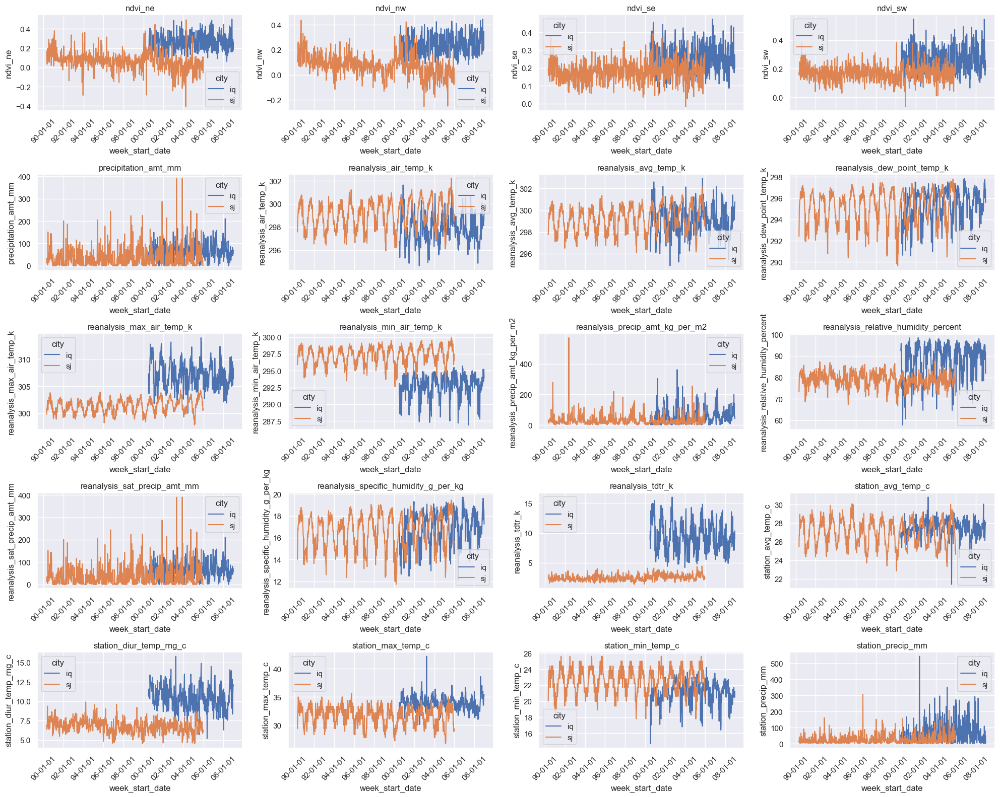

In [381]:
import matplotlib.dates as mdates

def linePlots(data, hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)  # Add this line
    plt.tight_layout()
    plt.show()

linePlots(data=df_train, hue='city')

## San Juan
- There appears to be some outliers


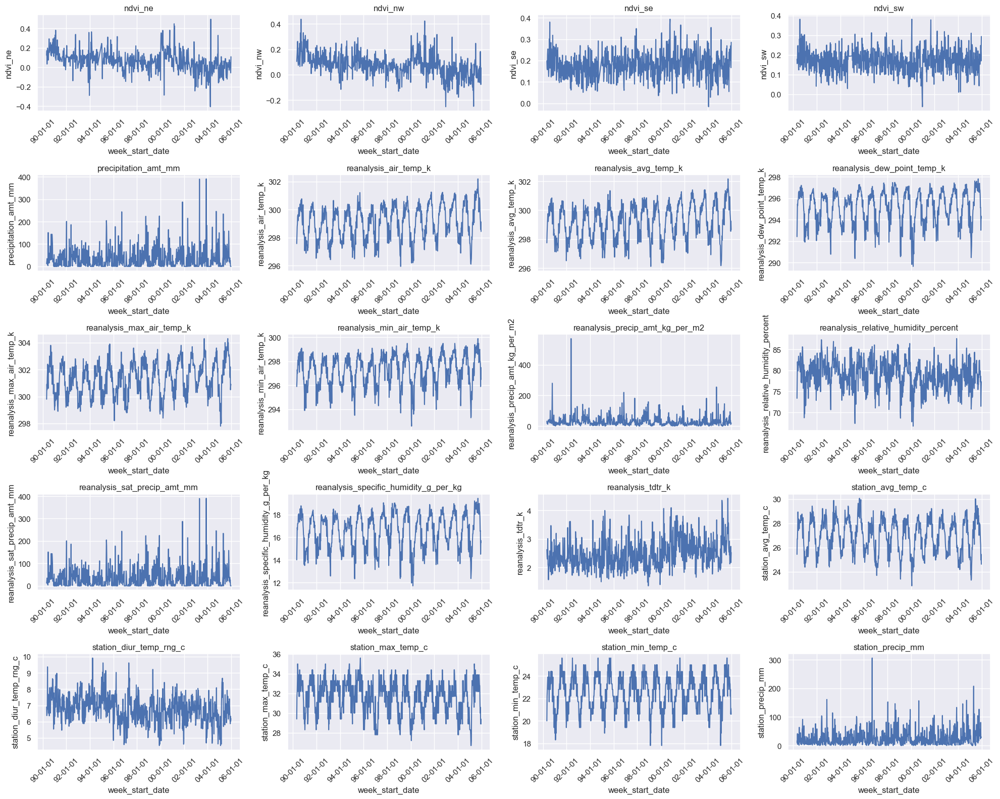

In [382]:
linePlots(data=df_train_sj)

## Iquitos
- There appears to be some outliers

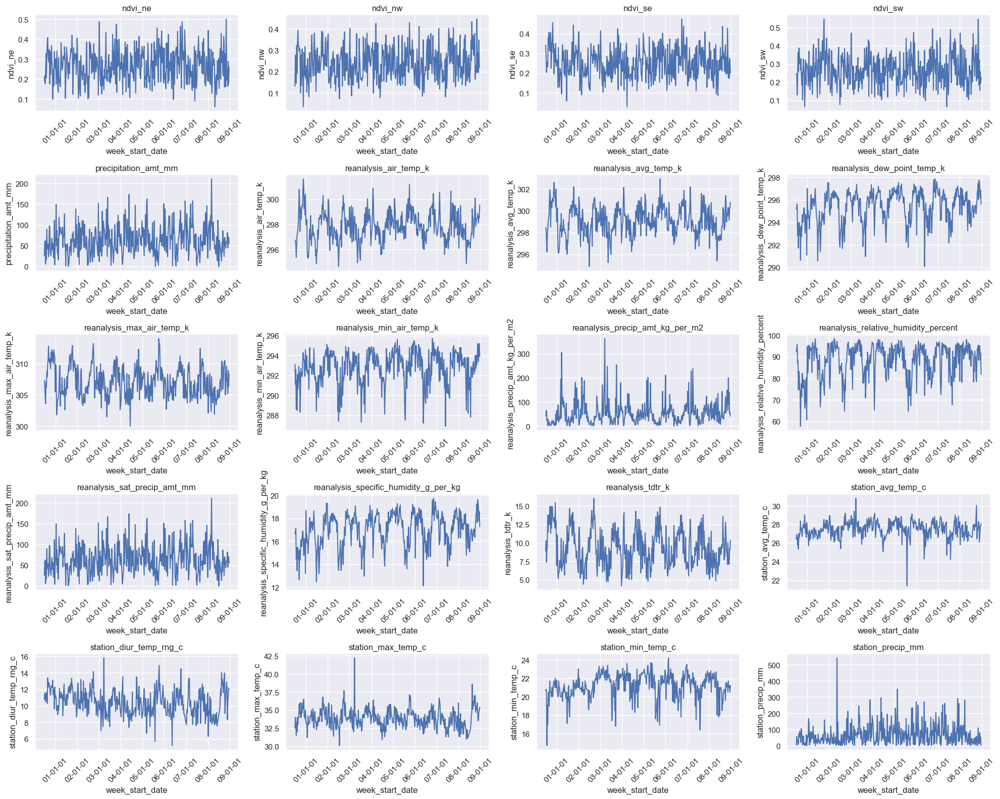

In [383]:
linePlots(data=df_train_iq, hue=None)

## Correlation analysis [- Helen: psxhs13]

Based on the Heatmap below, we observe the following:
*  Some features are highly correlated over 0.9 with correlation coefficient 
*  Therefore, from each pair of highly correlated features one will be dropped since they may not provide additional information but create problems for some algorithms due to multicollinearity
*  Weak correlation is observed between features and target, which may suggest non-linear relationship

### Correlation: San Juan

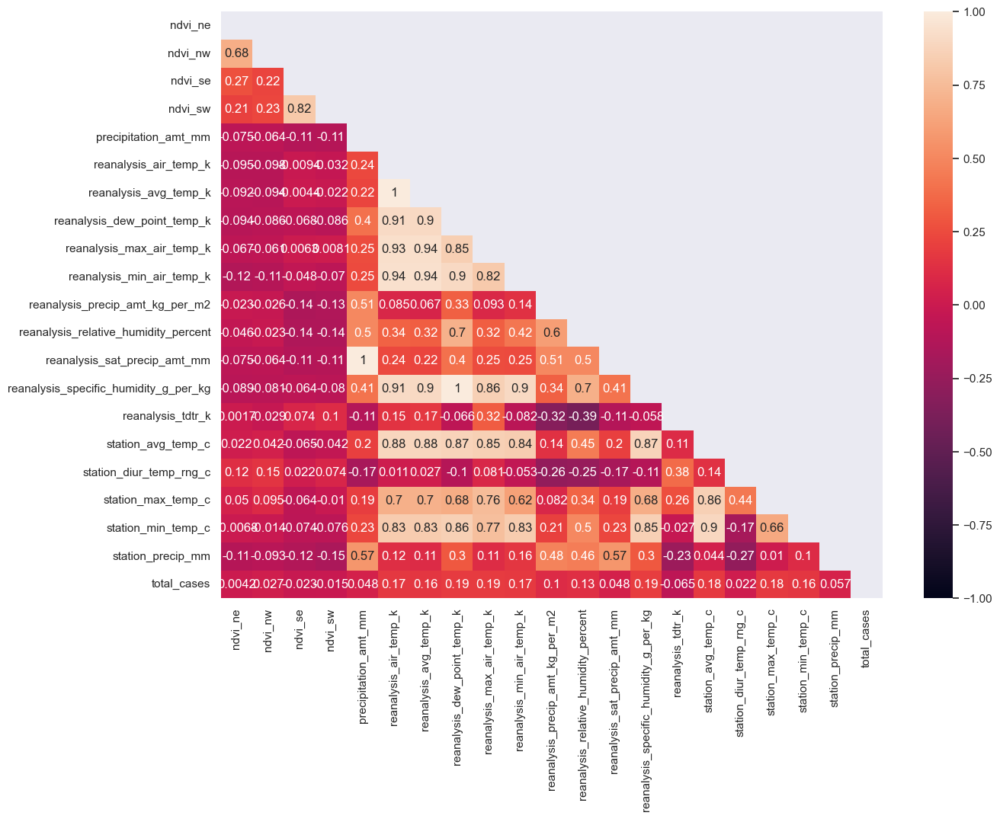

In [384]:
# corrMat = df_train.loc[df_train['city']=='sj',features].corr()
corrMat = df_train_sj[features].corr()
mask = np.zeros_like(corrMat)
mask[np.triu_indices_from(mask)]=True


import seaborn as sns
plt.figure(figsize =(14,10))
sns.heatmap(corrMat,vmin = -1, vmax = 1, annot=True, mask=mask)
plt.show()


#### Identify highly correlated variables

In [385]:
# Identify highly correlated features
# Initialize an empty list to store correlated variable pairs
highly_corr_pairs_sj = []

# Iterate over each column in the correlation matrix
for col in corrMat.columns:
    # Find variables with correlation greater than 0.9
    high_corr_vars = corrMat[abs(corrMat[col]) > 0.9].index.to_list()

    # If there are more than one highly correlated variables
    if len(high_corr_vars) > 1:
        # Add the pairs to the list
        for var in high_corr_vars:
            if var != col:  # Avoid adding self-correlations
                highly_corr_pairs_sj.append((col, var))

# Print the list of highly correlated variable pairs
print("Highly correlated variable pairs:")
for pair in highly_corr_pairs_sj:
    print(pair)

Highly correlated variable pairs:
('precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm')
('reanalysis_air_temp_k', 'reanalysis_avg_temp_k')
('reanalysis_air_temp_k', 'reanalysis_dew_point_temp_k')
('reanalysis_air_temp_k', 'reanalysis_max_air_temp_k')
('reanalysis_air_temp_k', 'reanalysis_min_air_temp_k')
('reanalysis_air_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_avg_temp_k', 'reanalysis_air_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_max_air_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_min_air_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_dew_point_temp_k', 'reanalysis_air_temp_k')
('reanalysis_dew_point_temp_k', 'reanalysis_min_air_temp_k')
('reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_max_air_temp_k', 'reanalysis_air_temp_k')
('reanalysis_max_air_temp_k', 'reanalysis_avg_temp_k')
('reanalysis_min_air_temp_k', 'reanalysis_air_temp_k')
('reanalysis_min_air_temp_k', 'reanalysi

### Correlation: Iquitos

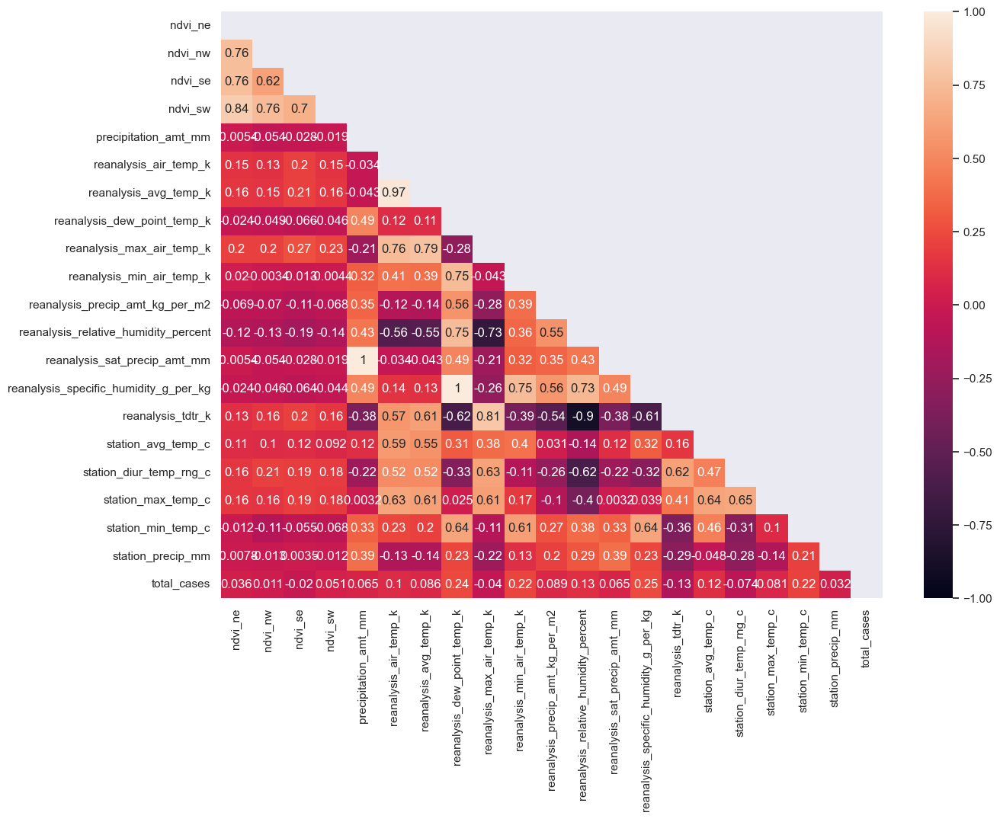

In [386]:
# corrMat = df_train.loc[df_train['city']=='iq',features].corr()
corrMat = df_train_iq[features].corr()
mask = np.zeros_like(corrMat)
mask[np.triu_indices_from(mask)]=True


import seaborn as sns
plt.figure(figsize =(14,10))
sns.heatmap(corrMat,vmin = -1, vmax = 1, annot=True, mask=mask)
plt.show()


#### Identify highly correlated variables

In [387]:
# Initialize an empty list to store correlated variable pairs
highly_corr_pairs_iq = []

# Iterate over each column in the correlation matrix
for col in corrMat.columns:
    # Find variables with correlation greater than 0.9
    high_corr_vars = corrMat[abs(corrMat[col]) > 0.9].index.to_list()

    # If there are more than one highly correlated variables
    if len(high_corr_vars) > 1:
        # Add the pairs to the list
        for var in high_corr_vars:
            if var != col:  # Avoid adding self-correlations
                highly_corr_pairs_iq.append((col, var))

# Print the list of highly correlated variable pairs
print("Highly correlated variable pairs:")
for pair in highly_corr_pairs_iq:
    print(pair)

Highly correlated variable pairs:
('precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm')
('reanalysis_air_temp_k', 'reanalysis_avg_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_air_temp_k')
('reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_sat_precip_amt_mm', 'precipitation_amt_mm')
('reanalysis_specific_humidity_g_per_kg', 'reanalysis_dew_point_temp_k')


## Pair plots [-Dominic: psxdm9]
- Some features are highly correlated for both cites
- Distinct climate patterns obeserved in some features as there is clear separaration between San Juan and Iquitos

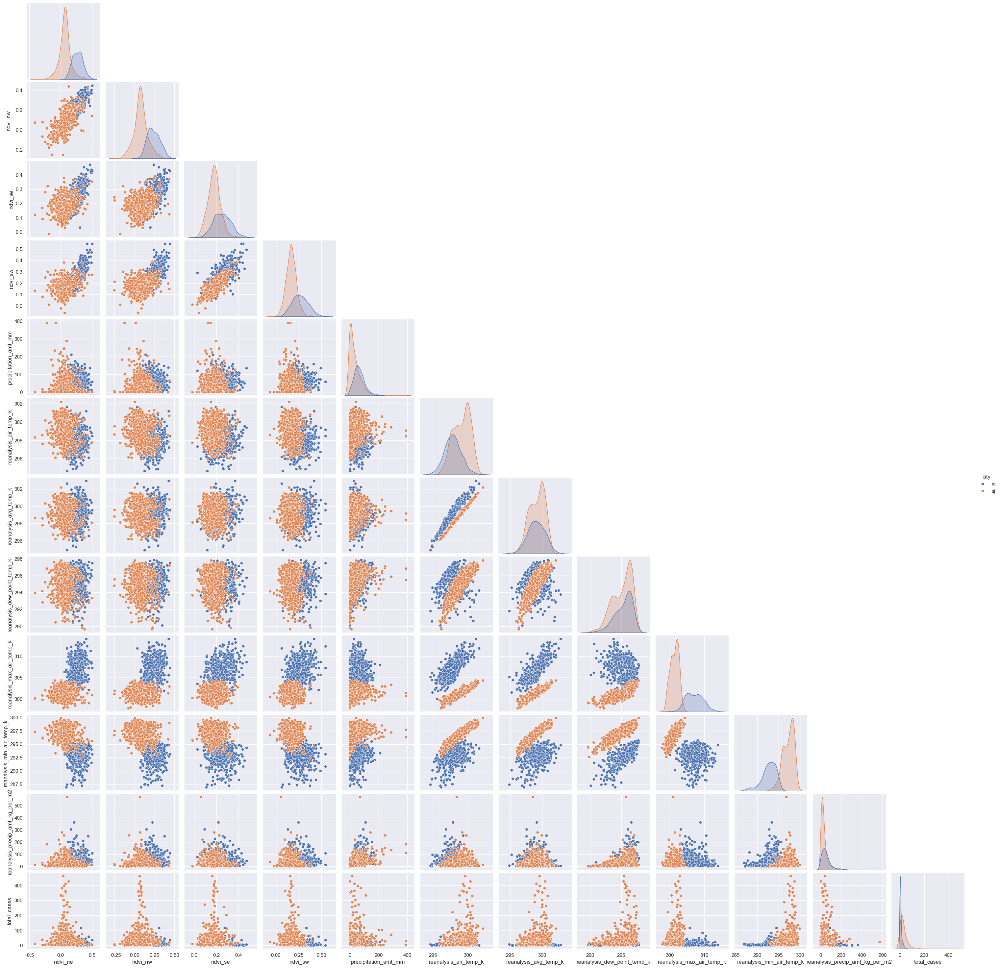

In [388]:
features_set1 = features[:11] + [features[-1]]
sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

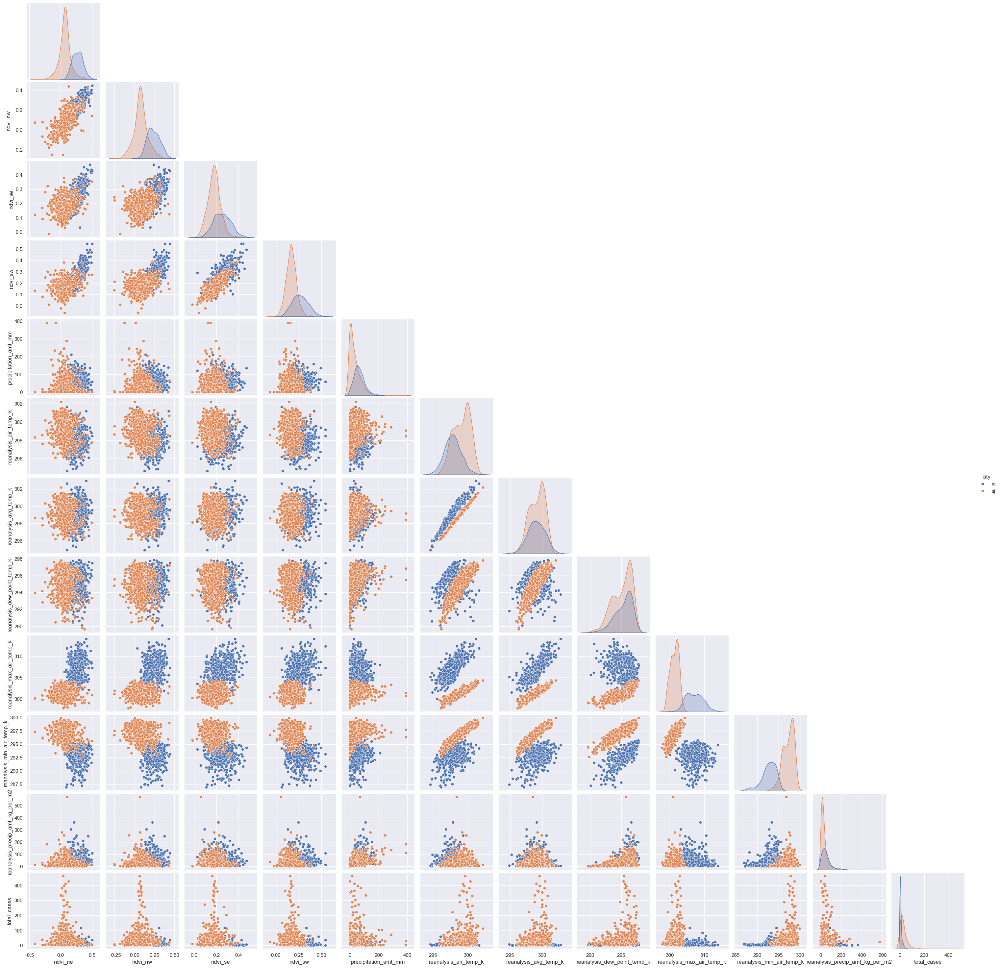

In [389]:
features_set2 = features[11:] + [features[-1]]
sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

## Dengue cases [Dominic: psxdm9]


## Dengue cases time series

- The data spans different periods in the two cities, with some overlaps
- Some huge spikes in number of cases observed in both cities

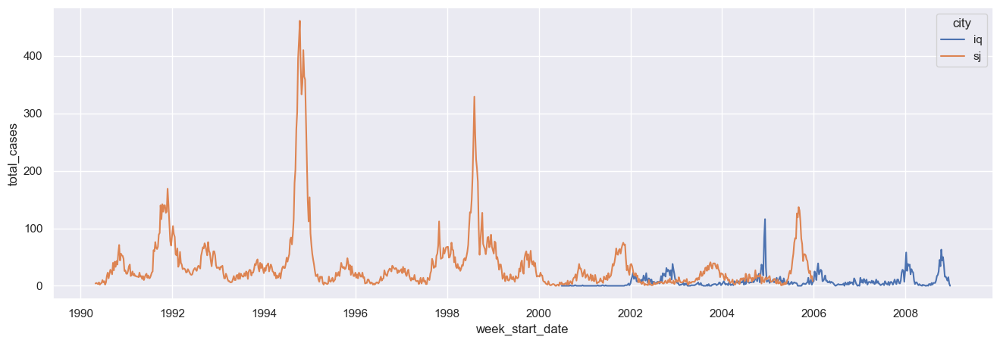

In [390]:
sns.lineplot(data=df_train, x= 'week_start_date', y = 'total_cases', hue='city')
plt.show()

## Iquitos - Total cases 
- number of cases are generally high towards end of year (week 40 - 52) and at the beginning of year (week 1 to week 10)
- time feature may me important

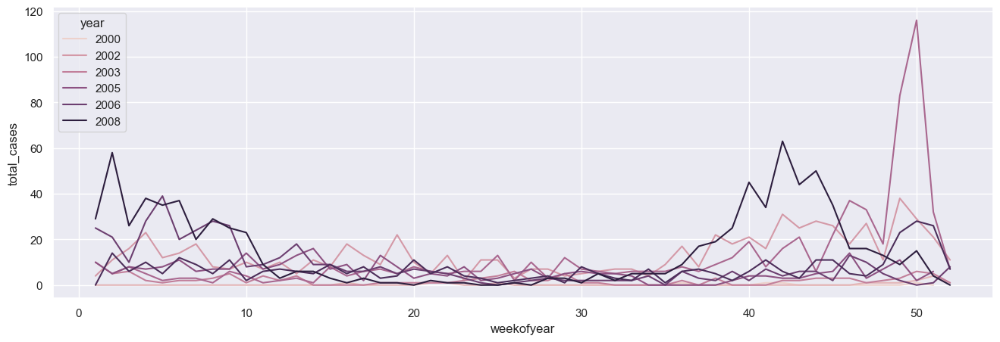

In [391]:
sns.lineplot(data=df_train.loc[df_train['city']=='iq'], x= 'weekofyear', y = 'total_cases', hue='year')
plt.show()

## Cases San Juan [Dominic: psxdm9]
- Also, number of cases are higher towards end of year from around week 35 - 52, and at the beginning of year week 1 - 10 with some few exceptions

In [392]:
# Identify outlier years
#
outlier_years_sj = df_train.loc[df_train['city']=='sj'].loc[df_train['total_cases']>200,'year'].unique()
years_sj = df_train.loc[df_train['city']=='sj']['year'].unique()
normal_years_sj = [i for i in years_sj if i not in outlier_years_sj]

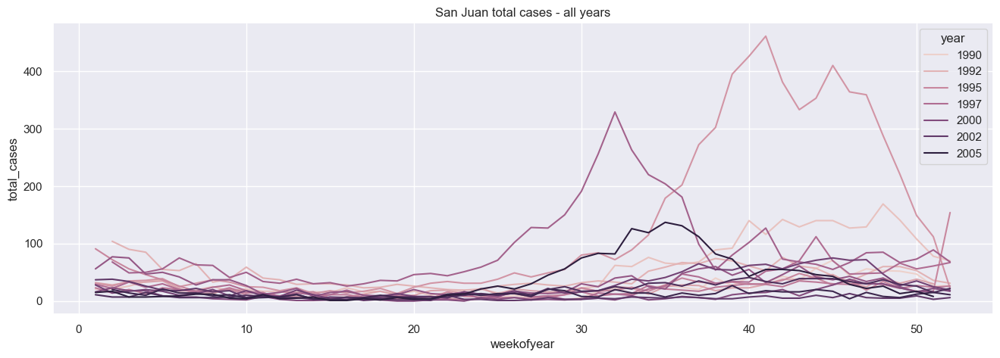

In [393]:
## San Juan - Total cases
cases_sj = df_train.loc[(df_train['city']=='sj') & (df_train['year'].isin(years_sj))]
sns.lineplot(data=cases_sj, x= 'weekofyear', y = 'total_cases', hue='year')
plt.title('San Juan total cases - all years')
plt.show()

Outlier years were identified as those containing too many cases relative to others, distorting the scale. The threshold was 200 cases.

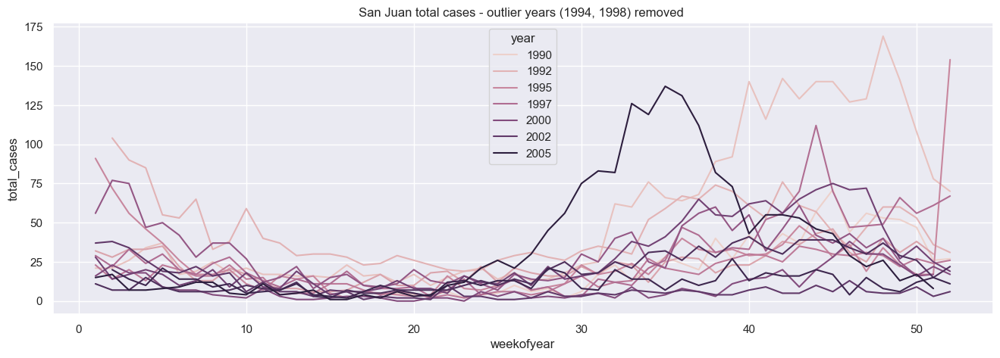

In [394]:
## San Juan - Total cases
cases_sj = df_train.loc[(df_train['city']=='sj') & (df_train['year'].isin(normal_years_sj))]
sns.lineplot(data=cases_sj, x= 'weekofyear', y = 'total_cases', hue='year')
plt.title('San Juan total cases - outlier years (1994, 1998) removed ')
plt.show()

## Distribution of Cases [Kwadwo: psxkd9]

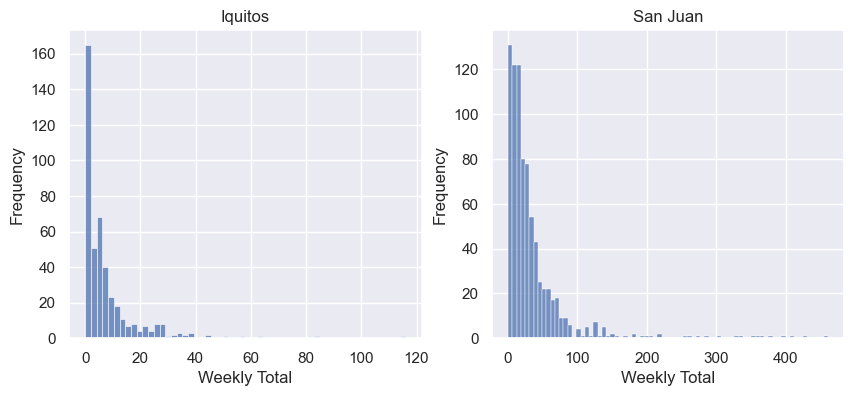

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

In [395]:
#
def yearly_pattern(labels_data, city_col, total_cases_col):

    cities = labels_data[city_col].unique()
    citynames = ['Iquitos', 'San Juan']
    num_cities = len(cities)
    fig, axes = plt.subplots(ncols=num_cities, figsize=(10, 4))

    # Iterate over each city and plot distplot
    for (i, city), n in zip(enumerate(cities), citynames):
        city_data = labels_data[labels_data[city_col] == city][total_cases_col]
        plt.figure(figsize=(8,6))
        sns.histplot(city_data, kde=False, ax=axes[i])
        axes[i].set_title(f'{n}')
        axes[i].set_xlabel('Weekly Total')
        axes[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.savefig('distribution.png')


yearly_pattern(df_train, 'city', 'total_cases')
plt.show()


###  Feature medians [Helen: psxhs13]

In [396]:
# Computing median by city and weekofyear
def medianByWeek(df):
    df_med = df[features+['city','weekofyear']].groupby(['city', 'weekofyear']).agg('median').reset_index()
    rename_dict = {}
    for feature in features:
        rename_dict[feature]='med_'+feature
        df_med.rename(rename_dict, inplace=True, axis=1)
    return df_med

df_med = medianByWeek(df=df_train)

In [397]:
df_med

,city,weekofyear,med_ndvi_ne,med_ndvi_nw,med_ndvi_se,med_ndvi_sw,med_precipitation_amt_mm,med_reanalysis_air_temp_k,med_reanalysis_avg_temp_k,med_reanalysis_dew_point_temp_k,...,med_reanalysis_relative_humidity_percent,med_reanalysis_sat_precip_amt_mm,med_reanalysis_specific_humidity_g_per_kg,med_reanalysis_tdtr_k,med_station_avg_temp_c,med_station_diur_temp_rng_c,med_station_max_temp_c,med_station_min_temp_c,med_station_precip_mm,med_total_cases
0,iq,1,0.254714,0.228529,0.250586,0.270400,59.110,298.162857,299.642857,296.060000,...,93.005714,59.110,17.618571,9.757143,28.112500,9.700000,33.30,21.80,72.50,10.0
1,iq,2,0.303274,0.292350,0.290017,0.294814,70.845,297.673571,299.007143,296.157857,...,93.420000,70.845,17.730000,7.828571,27.606667,10.300000,34.20,22.25,60.80,8.0
2,iq,3,0.256493,0.195148,0.268136,0.224971,76.160,298.201429,299.796429,296.355000,...,92.165000,76.160,17.958571,8.864286,28.000000,9.900000,33.80,22.10,96.70,8.0
3,iq,4,0.231279,0.225769,0.214421,0.285093,67.035,297.870000,299.007143,295.833571,...,90.213571,67.035,17.427857,8.100000,27.940000,10.600000,33.90,21.95,56.70,8.5
4,iq,5,0.233014,0.235186,0.196486,0.205543,71.550,298.271429,299.792857,296.392143,...,93.067857,71.550,17.977143,9.042857,27.725000,10.300000,34.35,22.25,89.60,6.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,sj,48,0.108625,0.103867,0.179629,0.166186,16.860,298.832857,298.935714,295.256429,...,80.243571,16.860,16.662857,2.085714,26.335714,6.350000,30.60,22.80,29.90,40.0
100,sj,49,0.056750,0.065875,0.181267,0.206850,4.150,298.560714,298.617857,294.795714,...,78.376429,4.150,16.182857,2.000000,26.278571,6.350000,30.30,21.95,24.15,28.0
101,sj,50,-0.003900,0.014733,0.191386,0.173014,0.000,298.595000,298.667857,294.423571,...,75.265714,0.000,15.802857,2.192857,25.864286,6.607143,29.70,21.70,9.90,31.0
102,sj,51,-0.000425,0.046133,0.182817,0.170057,0.000,298.435714,298.546429,294.222857,...,77.476429,0.000,15.622857,2.200000,25.778571,6.007143,30.30,21.70,22.60,24.5


## Median of features by week and city [Helen: psxhs13]
 - There is considerable difference in climate and vegetation between the two cities

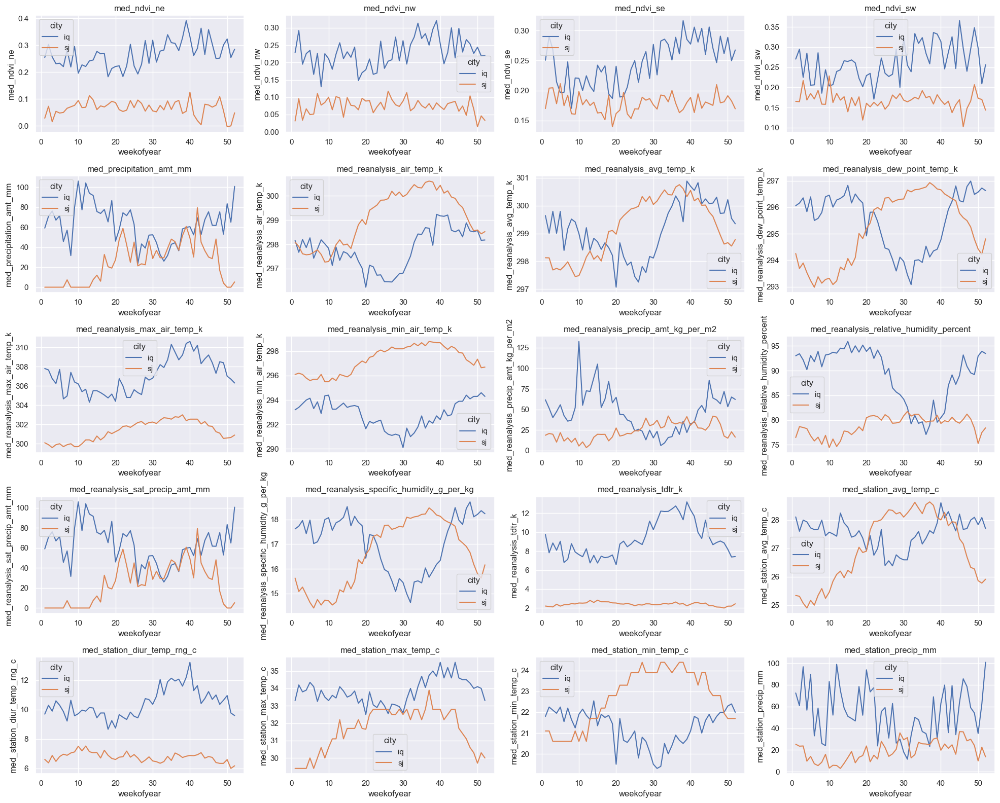

In [398]:
med_features = df_med.columns[1:]

fig, axs = plt.subplots(5,4, figsize = (20,16))
axs = axs.ravel()

for f, ax in zip(med_features[1:],axs):
    sns.lineplot(data=df_med, x = 'weekofyear', y=f, ax=ax, hue='city')
    ax.set_title(f)
plt.tight_layout()


## Features vs Target (standardized) [Dominic: psxdm9]

## Iquitos
Key observations:
- partial comovement between number of cases and some features e.g. minimum air temperature `reanalysis_min_air_temp_k` and dew point `reanalysis_dew_point_temp_k`
- Patterns an not as much as obvious compared to San Juan


In [399]:
import sklearn
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
all_scaled_iq = scaler.fit_transform(X=df_train_iq.iloc[:,4:])
scaler.get_feature_names_out()
df_scaled_iq= pd.DataFrame(all_scaled_iq, columns=scaler.get_feature_names_out(), index=df_train_iq.index)
df_scaled_iq = pd.concat((df_train_iq[datetimecols], df_scaled_iq), axis=1)




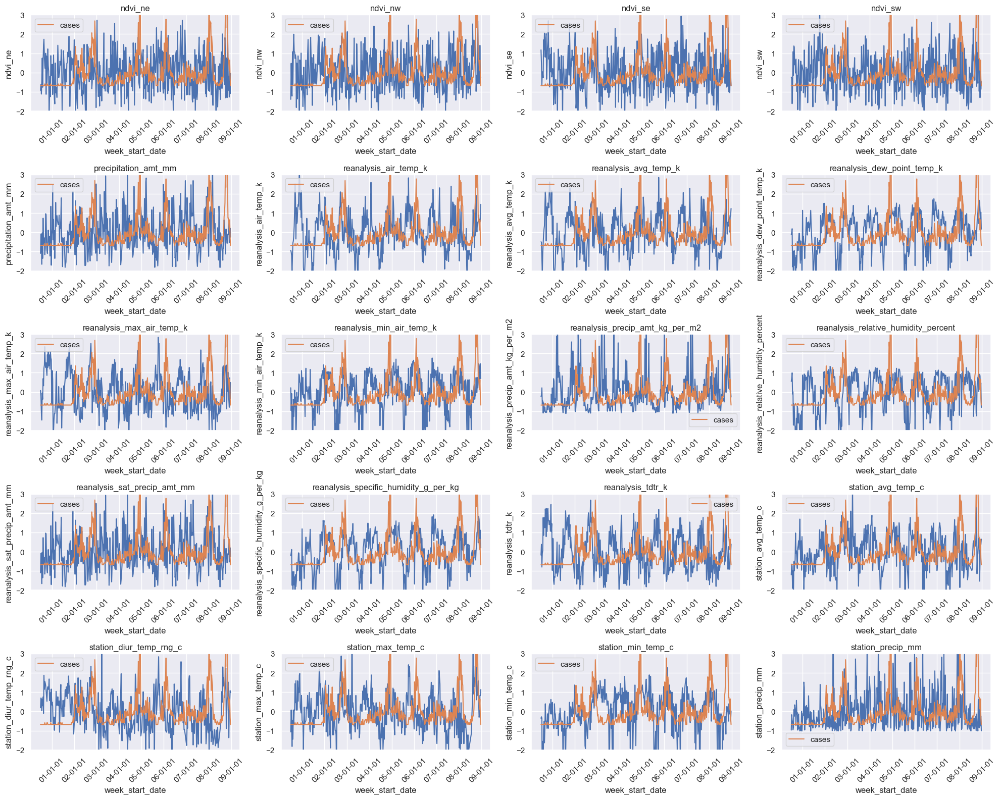

In [400]:
def linePlots2(data, features,hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        sns.lineplot(x='week_start_date', y='total_cases', ax=ax, data=data, hue=hue, label='cases')
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)
        ax.set_ylim(-2,3)
    plt.tight_layout()
    plt.show()

linePlots2(data=df_scaled_iq, features=features)

### San Juan features vs number of cases (standardized)
- There is a some commovement between temperature and total disease cases in San Juan, eg. increase in temperature is followed by increased number of cases
- The similar effect has also been observed in humidity variable ['reanalysis_specific_humidity_g_per_kg']

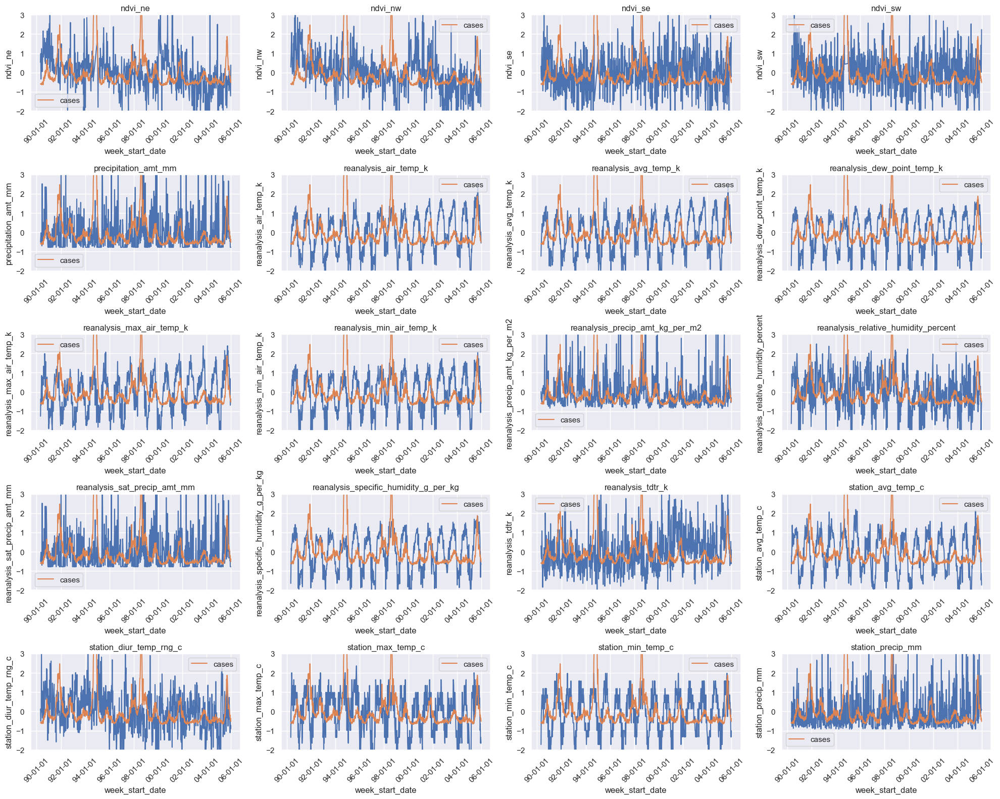

In [401]:
scaler = StandardScaler()
all_scaled_sj = scaler.fit_transform(X=df_train_sj.iloc[:,4:])
scaler.get_feature_names_out()
df_scaled_sj= pd.DataFrame(all_scaled_sj, columns=scaler.get_feature_names_out(), index=df_train_sj.index)
df_scaled_sj = pd.concat((df_train_sj[datetimecols], df_scaled_sj), axis=1)
linePlots2(data=df_scaled_sj, features=features)

## Box plots [Kwadwo: psxkd9]
- The scales of features are quite different, scaling may be necessary for some algorithms
- Outliers are also evident especially for precipitation

### San Juan

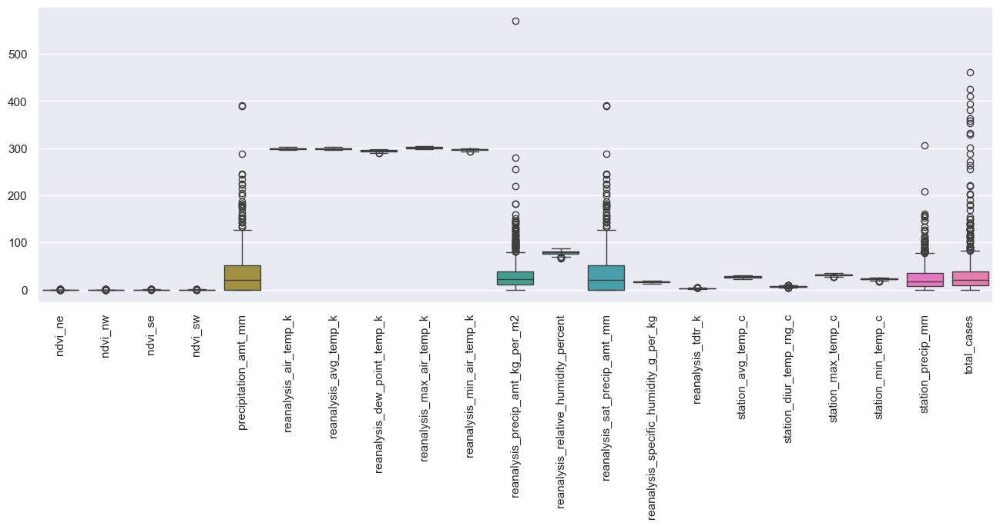

In [402]:
sns.set(rc={'figure.figsize': (16, 5)})

# Create the boxplot
ax = sns.boxplot(data=df_train_sj[features[:]])
ax.tick_params(axis='x', rotation=90)


# Show the plot
plt.show()

### Iquitos

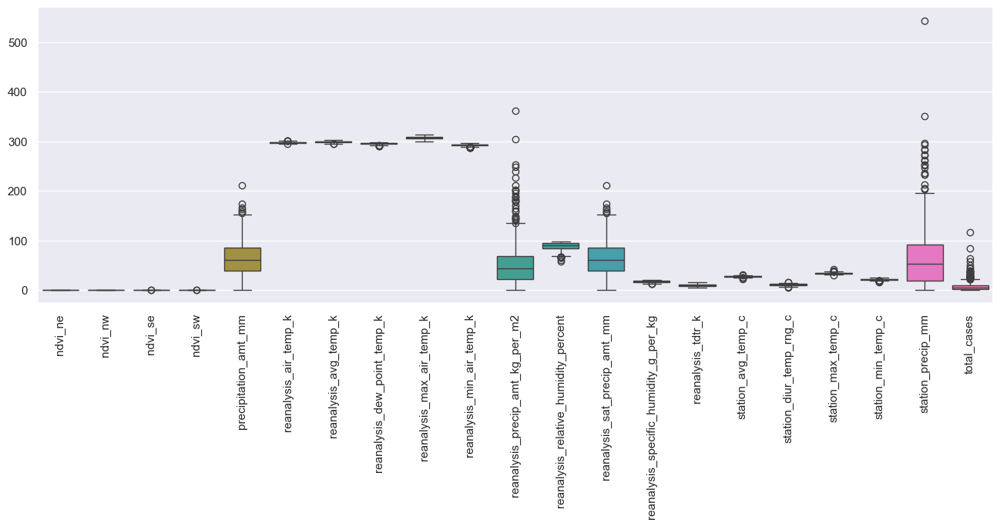

In [403]:
sns.set(rc={'figure.figsize': (16, 5)})

# Create the boxplot
ax = sns.boxplot(data=df_train_iq[features[:]])
ax.tick_params(axis='x', rotation=90)


# Show the plot
plt.show()

### Box plots [Helen: psxhs13]
- There is considerable difference between cities
- It may necessitate doing analysis separately
- Cases in in San Juan are generally higher compared to Iquitos

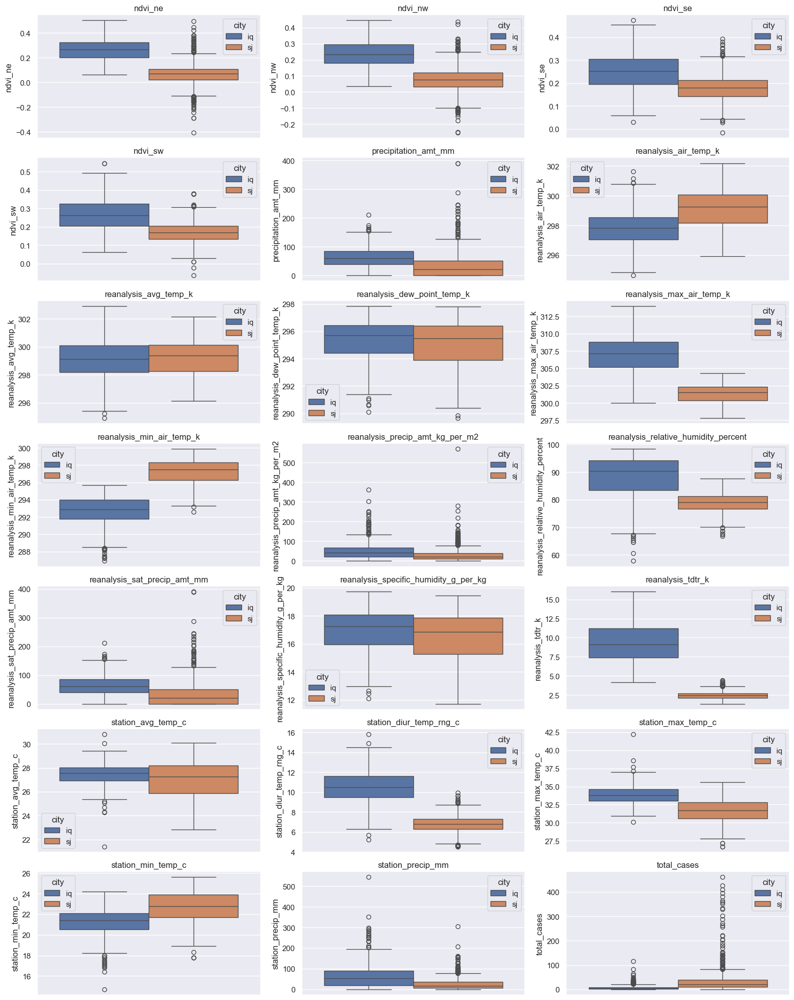

In [404]:
def boxplots(data, features,hue=None):
    fig, axs = plt.subplots(7, 3, figsize=(16, 20))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.boxplot(y=col, ax=ax, data=data, hue=hue)
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

boxplots(data=df_train, features=features, hue='city')

## Prepare training and testing data [Dominic: psxdm9]

In [405]:
# This applies for training data, we pretend we dont know labels for testing data
df_train['month'] = df_train['week_start_date'].dt.month
# df_test['total_cases'] = df_test['total_cases']+1

df_test['month'] = df_test['week_start_date'].dt.month
# df_test['total_cases'] = df_test['total_cases']+1

In [406]:

# If you want to keep all variables just, change columns2drop -- leave 'total_cases' only

# columns to drop
def features2drop(colums2drop):
    features2keep = [f for f in df_train.columns if f not in colums2drop]
    return features2keep

base_cols = ['city', 'weekofyear','year','week_start_date', 'total_cases']

# Also drop highly correlated features, one from each pair
colums2drop_iq = base_cols + list(set([i[1] for i in highly_corr_pairs_iq]))
colums2drop_sj = base_cols + list(set([i[1] for i in highly_corr_pairs_sj]))

features2keep_iq = features2drop(colums2drop_iq)
features2keep_sj = features2drop(colums2drop_sj)

def generate_data(input_data, city, features):
    return input_data.loc[input_data['city']==city,features]

X_train_iq = generate_data(df_train,'iq', features2keep_iq)
X_train_sj = generate_data(df_train,'sj', features2keep_sj)

X_test_iq = generate_data(df_test,'iq', features2keep_iq)
X_test_sj = generate_data(df_test,'sj', features2keep_sj)


# Target - Train
y_train_iq = df_train.loc[df_train['city']=='iq',['total_cases']]['total_cases']
y_train_sj = df_train.loc[df_train['city']=='sj',['total_cases']]['total_cases']

# Target - Test
y_test_iq = df_test.loc[df_test['city']=='iq',['total_cases']]['total_cases']
y_test_sj = df_test.loc[df_test['city']=='sj',['total_cases']]['total_cases']

In [407]:
print(f"Years Train iq: {df_train.loc[df_train['city']=='iq', 'year'].unique()}")
print(f"Years Test iq: {df_test.loc[df_test['city']=='iq', 'year'].unique()}")
# df_test['year'].unique()

Years Train iq: [2000 2001 2002 2003 2004 2005 2006 2007 2008]
Years Test iq: [2009 2010]


In [408]:
print(f"Years Train sj: {df_train.loc[df_train['city']=='sj', 'year'].unique()}")
print(f"Years Test sj: {df_test.loc[df_test['city']=='sj', 'year'].unique()}")

Years Train sj: [1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005]
Years Test sj: [2006 2007 2008]


In [409]:
# Helper function for plotting
def plot_predict(source_data, actual, predicted):
    df_pred = pd.DataFrame({'Actual': actual, 'Predicted': predicted})
    df_pred.index = source_data['week_start_date']
    plt.figure(figsize=(6, 4))
    plt.plot(df_pred['Actual'], label='Actual')
    plt.plot(df_pred['Predicted'], label='Predicted')
    plt.legend()
    plt.xticks(rotation=90) 

In [410]:
# Engineering time features
from sklearn.preprocessing import FunctionTransformer
def sin_transformer(period):
    return FunctionTransformer(lambda x: np.sin(x / period * 2 * np.pi))

def cos_transformer(period):
    return FunctionTransformer(lambda x: np.cos(x / period * 2 * np.pi))


## MODELS [Helen, Dominic, Kwadwo]

## SVR
- Dominic: psxdm9

In [411]:

from sklearn.model_selection import cross_val_score, TimeSeriesSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVR
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
import numpy as np

CITY = 'iq'

# Define the preprocessing steps
scaler = Pipeline([('scaler', RobustScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep_iq)])



# Define the transformed target regressor
regressor = SVR()
target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
pipeline = Pipeline(steps=[('preprocess', transformer),('select', selector), ('transform_target', target_transformer)])

# Define the hyperparameter grid for grid search
param_grid = {
    'transform_target__regressor__C': np.linspace(0.01, 1, 10),
    'transform_target__regressor__kernel': ['rbf', 'poly', 'linear'],
    'transform_target__regressor__gamma': np.linspace(0.001, 0.1, 20)
}

# Perform grid search

tscv = TimeSeriesSplit(n_splits=5)

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, n_jobs=-1, scoring='neg_mean_absolute_error')
models = grid_search.fit(X=X_train_iq, y=y_train_iq)
best_model = models.best_estimator_

# Evaluate the best model
best_model_mae_cv = cross_val_score(estimator=best_model, X=X_train_iq, y=y_train_iq, scoring='neg_mean_absolute_error')

mean_mae_cv = round(-np.mean(best_model_mae_cv),3)
sd_mae_cv = round(np.std(best_model_mae_cv),3)

print(f"Cross-validated MAE -{CITY}: {mean_mae_cv:.2f}")

y_pred_iq = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_true=y_test_iq, y_pred=y_pred_iq)


# save results
res_svr_iq = {'algorithm': ['SVR'],
       'city': ['Iquitos'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [round(mae,3)], 
       'nMAE': [round(mae/np.mean(y_test_iq),3)] # Compute normalized MAE for comparison between cities
         }

res_svr_iq


Cross-validated MAE -iq: 6.85


{'algorithm': ['SVR'],
 'city': ['Iquitos'],
 'MAE CV': [6.852],
 'MAE SD': [1.694],
 'MAE test': [4.61],
 'nMAE': [0.642]}

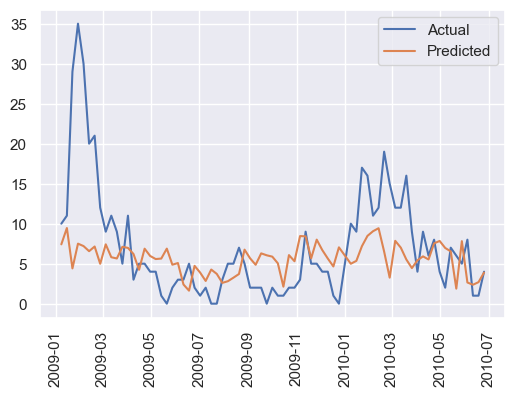

In [412]:
plot_predict(df_test_iq, y_test_iq, y_pred_iq)

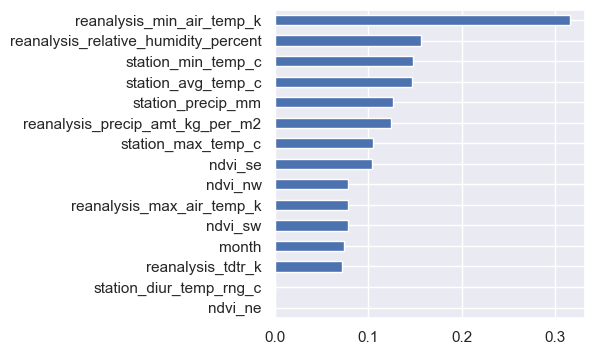

In [413]:
# feature importance
from sklearn.inspection import permutation_importance
importance_svm_iq = permutation_importance(best_model, X_train_iq, y_train_iq, scoring= 'neg_mean_absolute_error', n_repeats=200, random_state=2024)
pd.Series(importance_svm_iq.importances_mean, index=X_train_iq.columns).sort_values().plot.barh(figsize=(4,4))
plt.show()

In [414]:
# Check parameters of the best model
best_model.named_steps['transform_target'].regressor

SVR(C=0.45, gamma=0.08957894736842105)

### SVR for San Juan
- Dominic: psxdm9


In [415]:

CITY = 'sj'

# Define the preprocessing steps
scaler = Pipeline([('scaler', StandardScaler())])
transformer = ColumnTransformer([('scaler', scaler, features2keep_sj), 
                                 ("month_sin", sin_transformer(12), ["month"]),
                                 ("month_cos", cos_transformer(12), ["month"])], remainder="passthrough")


# Define the transformed target regressor
regressor = SVR()
target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)


# Create the pipeline
pipeline = Pipeline(steps=[('preprocess', transformer), ('transform_target', target_transformer)])


param_grid = {
    'transform_target__regressor__C': np.linspace(0.1, 1, 10),
    'transform_target__regressor__kernel': ['rbf', 'poly', 'linear']
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, scoring='neg_mean_absolute_error')

models = grid_search.fit(X=X_train_sj, y=y_train_sj)
best_model = models.best_estimator_

# Evaluate the best model
best_model_mae_cv = cross_val_score(estimator=best_model, X=X_train_sj, y=y_train_sj, scoring='neg_mean_absolute_error')

mean_mae_cv = round(-np.mean(best_model_mae_cv),3)
sd_mae_cv = round(np.std(best_model_mae_cv),3)

y_pred_sj = best_model.predict(X_test_sj)
mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)



# save results
res_svr_sj = {'algorithm': ['SVR'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [round(mae,3)],
       'nMAE': [round(mae/np.mean(y_test_sj),3)]
         }

res_svr_sj

{'algorithm': ['SVR'],
 'city': ['San Juan'],
 'MAE CV': [24.256],
 'MAE SD': [9.928],
 'MAE test': [14.953],
 'nMAE': [0.689]}

In [416]:
# Check parameters of the best model
best_model.named_steps['transform_target'].regressor

SVR(C=0.1)

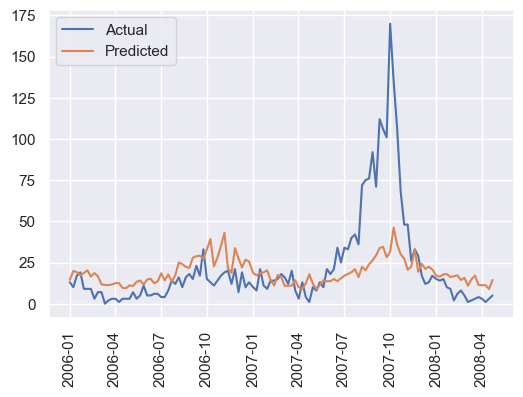

In [417]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)


## XGboost - Iquitos
- Dominic: psxdm9

In [418]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [419]:
import xgboost
from xgboost import XGBRegressor

CITY = 'iq'

tscv = TimeSeriesSplit(n_splits=5)

# Define the preprocessing steps
scaler = Pipeline([('scaler', RobustScaler())])
transformer = ColumnTransformer([('scaler', scaler, features2keep_iq)])


# Define the transformed target regressor
xgb = XGBRegressor()
target_transformer = TransformedTargetRegressor(regressor=xgb, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
tscv = TimeSeriesSplit(n_splits=5)

pipeline = Pipeline(steps=[('preprocess', transformer), ('target_transformer', target_transformer)])


param_grid = {
    'target_transformer__regressor__learning_rate': [0.001,0.05,0.09],
    'target_transformer__regressor__max_depth': [3, 4, 6, 10],
    'target_transformer__regressor__gamma': [0.01, 0.02],
    'target_transformer__regressor__n_estimators': [100,300],
    'target_transformer__regressor__reg_lambda': [1,3,5],
}


grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='neg_mean_absolute_error', n_jobs=-1, cv=tscv)

model = grid_search.fit(X_train_iq, y_train_iq)
best_model = model.best_estimator_
mae_cv = cross_val_score(best_model, X_train_iq, y_train_iq, cv=tscv)

mean_mae_cv = -np.mean(mae_cv)
mean_mae_sd = np.std(mae_cv)


y_pred_iq = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_pred=y_pred_iq, y_true=y_test_iq)


# save results
res_xgb_iq = {'algorithm': ['XGboost'],
       'city': ['Iquitos'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae],
       'nMAE': [round(mae/np.mean(y_test_iq),3)]
         }
res_xgb_iq


{'algorithm': ['XGboost'],
 'city': ['Iquitos'],
 'MAE CV': [0.6200353143544561],
 'MAE SD': [9.928],
 'MAE test': [4.768799565340343],
 'nMAE': [0.664]}

In [420]:
# Check parameters of the best model
best_model.named_steps['target_transformer'].regressor

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.02, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

### plot predicted vs actuals

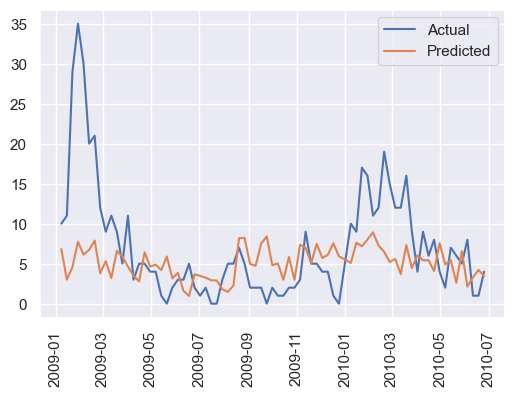

In [421]:
plot_predict(df_test_iq, y_test_iq, y_pred_iq)

## XGboost - San Juan
- Dominic: psxdm9

In [422]:
CITY = 'sj'

# Define the preprocessing steps
scaler = Pipeline([('scaler', RobustScaler())])

transformer = ColumnTransformer([('scaler', scaler, features2keep_sj), 
                                 ("month_sin", sin_transformer(12), ["month"]),
                                 ("month_cos", cos_transformer(12), ["month"])], remainder="passthrough")

xgb = XGBRegressor()
# Define the transformed target regressor
target_transformer = TransformedTargetRegressor(regressor=xgb, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
tscv = TimeSeriesSplit(n_splits=5)
pipeline = Pipeline(steps=[('preprocess', transformer), ('target_transformer', target_transformer)])

param_grid = {
    'target_transformer__regressor__learning_rate': [0.001, 0.005, 0.09],
    'target_transformer__regressor__max_depth': [4, 6, 7,12],
    'target_transformer__regressor__gamma': [0.01, 0.02],
    'target_transformer__regressor__n_estimators': [500, 700]
}

# Fine tuning
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='neg_mean_absolute_error', n_jobs=-1, cv=tscv)
model = grid_search.fit(X_train_sj, y_train_sj)
best_model = model.best_estimator_

# compute MAE
mae_cv = cross_val_score(best_model, X_train_sj, y_train_sj, cv=tscv)
mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict
y_pred_sj = best_model.predict(X_test_sj)
mae = mean_absolute_error(y_pred=y_pred_sj, y_true=y_test_sj)

# Save results
res_xgb_sj = {'algorithm': ['XGboost'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae],
       'nMAE': [round(mae/np.mean(y_test_sj),3)]
         }
res_xgb_sj

{'algorithm': ['XGboost'],
 'city': ['San Juan'],
 'MAE CV': [0.20112024992314118],
 'MAE SD': [0.29688513942805184],
 'MAE test': [13.868474782991015],
 'nMAE': [0.639]}

In [423]:
# Check parameters of the best model
best_model.named_steps['target_transformer'].regressor

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.02, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.005, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

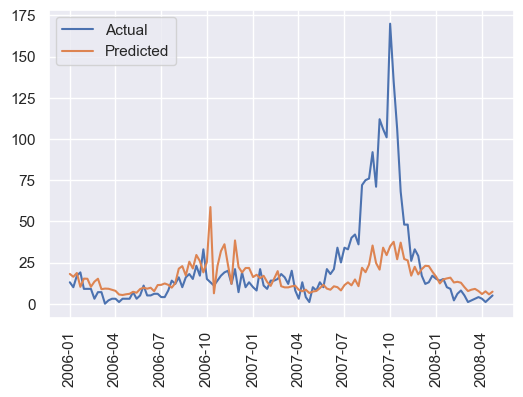

In [424]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

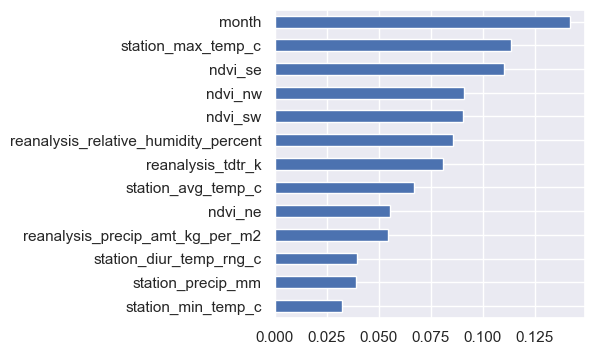

In [425]:
# Feature importances
importance_xgb_sj =  best_model.named_steps['target_transformer'].regressor.fit(X_train_sj,y_train_sj).feature_importances_
importance_xgb_sj = pd.Series(importance_xgb_sj,X_train_sj.columns)
importance_xgb_sj.sort_values().plot.barh(figsize=(4,4))
plt.savefig('importance.png')
plt.show()



## Poisson regression
### Iquitos
- Kwadwo: psxkd9


In [426]:
from sklearn.linear_model import PoissonRegressor

pipeline = Pipeline(steps=[('scaler', StandardScaler()), ('regressor',PoissonRegressor())])

# Hyperparameter tuning
param_grid = {
    'regressor__alpha': [2.0, 3.0, 5.0],   # Regularization parameter (L1)
    'regressor__fit_intercept': [True, False],  # Whether to fit an intercept term
    'regressor__max_iter': [200, 300,500],  # Maximum number of iterations
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv)

# Fit the model for Iquitos
model = grid_search.fit(X_train_iq, y_train_iq)
best_model = model.best_estimator_

# Compute MAE
mae_cv = cross_val_score(estimator=best_model, X=X_train_iq, y=y_train_iq, cv=tscv)
mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_iq = best_model.predict(X_test_iq)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_iq, y_pred_iq)


# save results
res_poisson_iq = {'algorithm': ['Poisson'],
       'city': ['Iquitos'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae],
       'nMAE': [round(mae/np.mean(y_test_iq),3)]
         }
res_poisson_iq

{'algorithm': ['Poisson'],
 'city': ['Iquitos'],
 'MAE CV': [2.2276426999038192],
 'MAE SD': [3.6720365397861148],
 'MAE test': [5.546672674006664],
 'nMAE': [0.772]}

In [427]:
poisson=best_model.named_steps['regressor']
poisson

PoissonRegressor(alpha=5.0, max_iter=200)

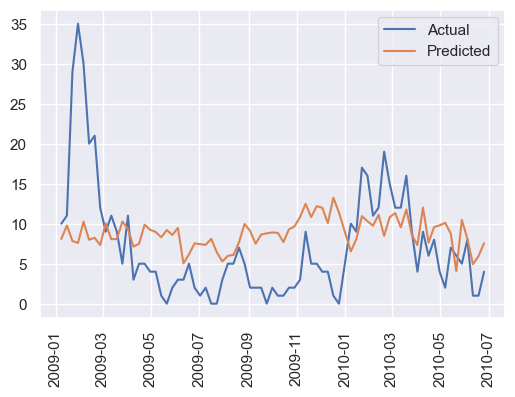

In [428]:
plot_predict(df_test_iq, y_test_iq, y_pred_iq)

## Poisson
### San Juan
- Kwadwo: psxkd9

In [429]:

pipeline = Pipeline(steps=[('scaler', StandardScaler()), ('regressor',PoissonRegressor())])


param_grid = {
    'regressor__alpha': np.linspace(0,20, 10),   # Regularization parameter (L1)
    'regressor__fit_intercept': [True, False],  # Whether to fit an intercept term
    'regressor__max_iter': [500, 1000],  # Maximum number of iterations
}

# Fine tuning
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv)

# Fit the model for Iquitos
model = grid_search.fit(X_train_sj, y_train_sj)
best_model = model.best_estimator_

# Compute MAE
mae_cv = cross_val_score(estimator=best_model, X=X_train_sj, y=y_train_sj, cv=tscv)
mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_sj = best_model.predict(X_test_sj)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_sj, y_pred_sj)


# Save results
res_poisson_sj = {'algorithm': ['Poisson'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae],
       'nMAE': [round(mae/np.mean(y_test_sj),3)]
         }
res_poisson_sj


{'algorithm': ['Poisson'],
 'city': ['San Juan'],
 'MAE CV': [0.7619951344217768],
 'MAE SD': [0.9795145122027623],
 'MAE test': [20.937782067109683],
 'nMAE': [0.965]}

In [430]:

poisson=best_model.named_steps['regressor']
poisson

PoissonRegressor(alpha=20.0, max_iter=500)

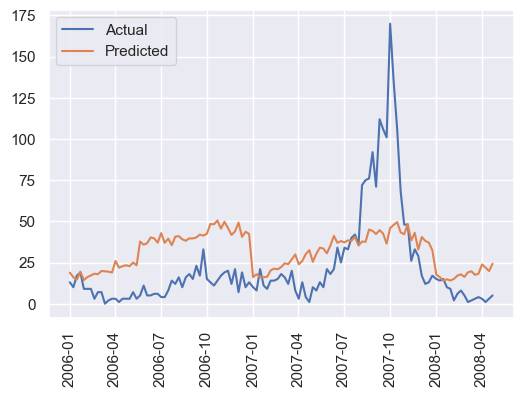

In [431]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

# Random forest
## San Juan
Kwadwo: psxkd9

In [432]:
from sklearn.ensemble import RandomForestRegressor

scaler = StandardScaler()
transformer = ColumnTransformer([('scaler', scaler, features2keep_sj), 
                                 ("month_sin", sin_transformer(12), ["month"]),
                                 ("month_cos", cos_transformer(12), ["month"])], remainder="passthrough")

pipeline = Pipeline(steps=[('transformer', transformer), 
                           ('regressor',RandomForestRegressor(random_state=2024,n_jobs=-1))])


param_grid = {
    'regressor__n_estimators': [200, 300, 500],   # Regularization parameter (L1)
    'regressor__max_depth': [3,6,10],
}

# Fine tuning
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, scoring='neg_mean_absolute_error')

# Fit the model for Iquitos
model = grid_search.fit(X_train_sj, y_train_sj)
best_model = model.best_estimator_

# Compute MAE
mae_cv = cross_val_score(estimator=best_model, X=X_train_sj, y=y_train_sj, cv=tscv)
mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_sj = best_model.predict(X_test_sj)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_sj, y_pred_sj)

# Save results
res_rf_sj = {'algorithm': ['RF'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae],
       'nMAE': [round(mae/np.mean(y_test_sj),3)]
         }
res_rf_sj



{'algorithm': ['RF'],
 'city': ['San Juan'],
 'MAE CV': [2.5774919192117585],
 'MAE SD': [3.6798013214820453],
 'MAE test': [20.334879740765626],
 'nMAE': [0.937]}

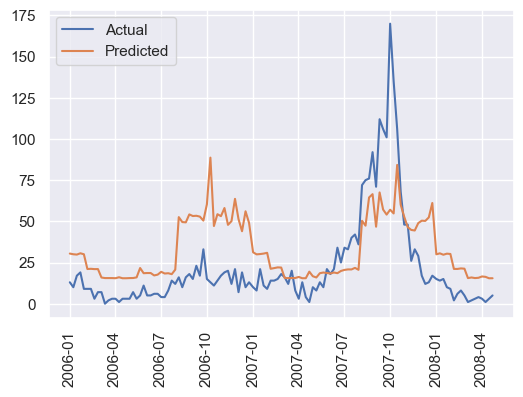

In [433]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

# Random forest
## Iquitos
Kwadwo: psxkd9

In [434]:

pipeline = Pipeline(steps=[('scaler', StandardScaler()), ('regressor',RandomForestRegressor(random_state=2024, n_jobs=-1))])
# make_pipeline(StandardScaler(), PoissonRegressor())

param_grid = {
    'regressor__n_estimators': [200, 300, 500],   # Regularization parameter (L1)
    'regressor__max_depth': [3,6,10],  # Whether to fit an intercept term
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, scoring='neg_mean_absolute_error')

# Fit the model for Iquitos
model = grid_search.fit(X_train_iq, y_train_iq)
best_model = model.best_estimator_

# compute MAE
mae_cv = cross_val_score(estimator=best_model, X=X_train_iq, y=y_train_iq, cv=tscv)
mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_iq = best_model.predict(X_test_iq)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_iq, y_pred_iq)


# save results
res_rf_iq = {'algorithm': ['RF'],
       'city': ['Iquitos'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae],
       'nMAE': [round(mae/np.mean(y_test_iq),3)]
         }
res_rf_iq



{'algorithm': ['RF'],
 'city': ['Iquitos'],
 'MAE CV': [1.1688518453968766],
 'MAE SD': [0.9104343652973856],
 'MAE test': [5.2861471563052],
 'nMAE': [0.736]}

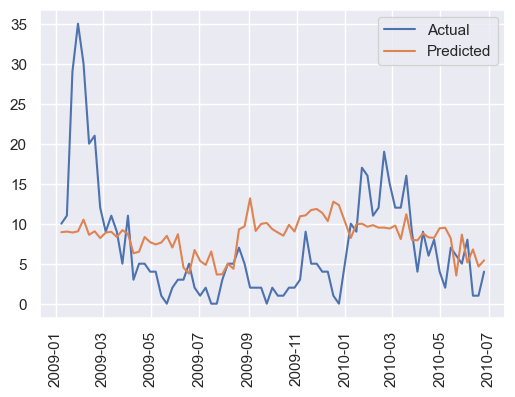

In [435]:
plot_predict(df_test_iq, y_test_iq, y_pred_iq)

## Gradient Boosted Tree(GBT) Regressor.
### Iquitos 
- Helen: psxhs13

In [436]:
from sklearn.ensemble import GradientBoostingRegressor

CITY = 'Iquitos'

# Initialize GBT
GB = GradientBoostingRegressor()
scaler = Pipeline([('scaler', RobustScaler())])

transformer = ColumnTransformer([('scaler', StandardScaler(), features2keep_iq)]) #appling standardization to the features

# Defining target transformation
target_transformer = TransformedTargetRegressor(regressor=GB, func=np.log1p, inverse_func=np.expm1) #appling a transformation to the target variable before fitting the model (here using np.log1p for log transformation, and np.expm1 for the inverse to transform back predictions).

# Define the pipeline
pipeline = Pipeline([('preprocess', transformer),\
    ('transform_target', target_transformer)])

param_grid = {'transform_target__regressor__learning_rate': [0.01, 0.1, 1],
    'transform_target__regressor__n_estimators': [50, 100, 200],
    'transform_target__regressor__max_depth': [3, 5, 10],
}

# Perform grid search
tscv = TimeSeriesSplit(n_splits=5)

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, n_jobs=-1, scoring ='neg_mean_absolute_error')
model = grid_search.fit(X=X_train_iq, y=y_train_iq)
best_model = model.best_estimator_

#Evaluate the best model
best_model_mae_cv = cross_val_score(estimator = best_model, X=X_train_iq, y=y_train_iq, scoring ='neg_mean_absolute_error')
y_pred_iq = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_true= y_test_iq, y_pred=y_pred_iq)

sd_mae_cv = np.std(best_model_mae_cv)
mean_mae_cv = -np.mean(best_model_mae_cv)

# save results
res_GBT_iq = {
    'algorithm': ['GBT'],
    'city': [CITY],
    'MAE CV': [mean_mae_cv],
    'MAE SD': [sd_mae_cv],
    'MAE test': [mae],
    'nMAE': [round(mae/np.mean(y_test_iq),3)]
}
res_GBT_iq

{'algorithm': ['GBT'],
 'city': ['Iquitos'],
 'MAE CV': [6.527408207809105],
 'MAE SD': [1.6777073501505044],
 'MAE test': [4.631997928445122],
 'nMAE': [0.645]}

In [437]:
# Check parameters of the best model
best_model.named_steps['transform_target'].regressor

GradientBoostingRegressor(learning_rate=0.01)

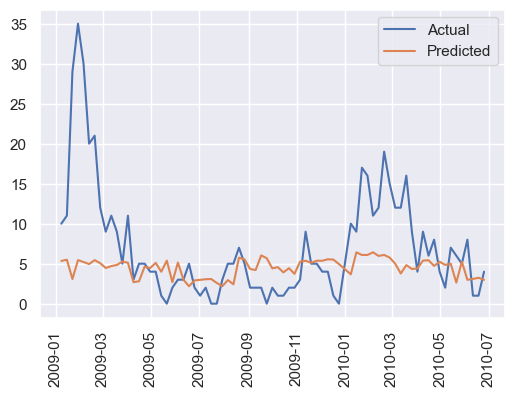

In [438]:

plot_predict(df_test_iq, y_test_iq, y_pred_iq)

## Gradient Boosting Regressor 
### San Juan
- Helen: psxhs13

In [439]:
CITY = 'San Juan'

# Model with parameter tuning - San Juan
GB = GradientBoostingRegressor()
scaler = Pipeline([('scaler', RobustScaler())])

transformer = ColumnTransformer([('scaler', StandardScaler(), features2keep_sj)]) #appling standardization to the features

# Defining target transformation
target_transformer = TransformedTargetRegressor(regressor=GB, func=np.log1p, inverse_func=np.expm1) #appling a transformation to the target variable before fitting the model (here using np.log1p for log transformation, and np.expm1 for the inverse to transform back predictions).

# Define the pipeline
pipeline = Pipeline([('preprocess', transformer),\
    ('transform_target', target_transformer)])

param_grid = {'transform_target__regressor__learning_rate': [0.01, 0.05, 0.9],
    'transform_target__regressor__n_estimators': [200, 300, 500],
    'transform_target__regressor__max_depth': [5, 8, 10],
}


# Perform grid search
tscv = TimeSeriesSplit(n_splits=5)

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, n_jobs=-1, scoring ='neg_mean_absolute_error')
model = grid_search.fit(X=X_train_sj, y=y_train_sj)
best_model = model.best_estimator_


#Evaluate the best model
best_model_mae_cv = cross_val_score(estimator = best_model, X=X_train_sj, y=y_train_sj, scoring ='neg_mean_absolute_error')

y_pred_sj = best_model.predict(X_test_sj)
mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)


sd_mae_cv =np.std(best_model_mae_cv)
mean_mae_cv = -np.mean(best_model_mae_cv)


# save results
res_GBT_sj = {
    'algorithm': ['GBT'],
    'city': [CITY],
    'MAE CV': [mean_mae_cv],
    'MAE SD': [sd_mae_cv],
    'MAE test': [mae],
    'nMAE': [round(mae/np.mean(y_test_sj),3)]
}

res_GBT_sj


{'algorithm': ['GBT'],
 'city': ['San Juan'],
 'MAE CV': [25.029940373372668],
 'MAE SD': [9.634911656881892],
 'MAE test': [15.473475490012614],
 'nMAE': [0.713]}

In [440]:
# Check parameters of the best model
best_model.named_steps['transform_target'].regressor

GradientBoostingRegressor(learning_rate=0.01, max_depth=5, n_estimators=200)

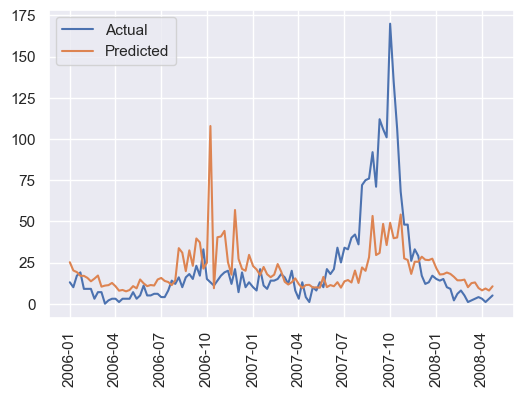

In [441]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

# Negative Binomial
- Helen: psxhs13

In [442]:
#Merging the train x,y set  and test x, y set
_train_iq = X_train_iq.join(y_train_iq)
_train_sj = X_train_sj.join(y_train_sj)
_test_iq = X_test_iq.join(y_test_iq)
_test_sj = X_test_sj.join(y_test_sj)

In [443]:
def formula(features2keep):
  concat_strings = ' + '.join(features2keep)
  return (f" total_cases ~ {concat_strings} ")

## Iquitos
- Helen: psxhs13

In [444]:
# import necessary libraries
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.api as sm
import statsmodels.formula.api as smf


CITY = 'Iquitos'

def nested_cross_validation(train, grid, features):
    best_alpha = None
    best_score = float('inf')

    # Define the model formula
    model_formula = formula(features)

    # Perform nested cross-validation
    tscv_outer = TimeSeriesSplit(n_splits=5)  # Outer cross-validation
    for alpha in grid:
        inner_scores = []  # Store inner CV scores
        for train_idx, val_idx in tscv_outer.split(train):
            train_fold, val_fold = train.iloc[train_idx], train.iloc[val_idx]
            model = smf.glm(formula=model_formula, data=train_fold, family=sm.families.NegativeBinomial(alpha=alpha))
            results = model.fit()
            predictions = results.predict(val_fold).astype(int)
            score = mean_absolute_error(predictions, val_fold.total_cases)
            inner_scores.append(score)
        mean_score = np.mean(inner_scores)
        
        if mean_score < best_score:
            best_alpha = alpha
            best_score = mean_score
            sd_score = np.std(inner_scores)

    # print('Best alpha:', best_alpha)
    # print('Best score (MAE) w/ CV:', best_score)

    # Train the final model with the best alpha on the entire training set
    final_model = smf.glm(formula=model_formula, data=train, family=sm.families.NegativeBinomial(alpha=best_alpha)).fit()


    return {'model': final_model, 'mean_score':best_score, 'sd_score':sd_score}

grid = np.linspace(0.1,100,20)
results = nested_cross_validation(_train_iq, grid, features2keep_iq)
best_model = results['model']


    # Final evaluation with the test set
y_pred_iq = best_model.predict(_test_iq)
mae = mean_absolute_error(_test_iq["total_cases"], y_pred_iq)
print("MAE Iquitos:", mae)


res_NB_iq = {'algorithm': ['NBR'],
       'city': ['Iquitos'],
       'MAE CV': [results['mean_score']],
       'MAE SD': [results['sd_score']],
       'MAE test': [mae],
       'nMAE': [round(mae/np.mean(y_test_iq),3)]
         }
res_NB_iq


MAE Iquitos: 5.726839139119568


{'algorithm': ['NBR'],
 'city': ['Iquitos'],
 'MAE CV': [7.854794520547945],
 'MAE SD': [2.620768130872433],
 'MAE test': [5.726839139119568],
 'nMAE': [0.797]}

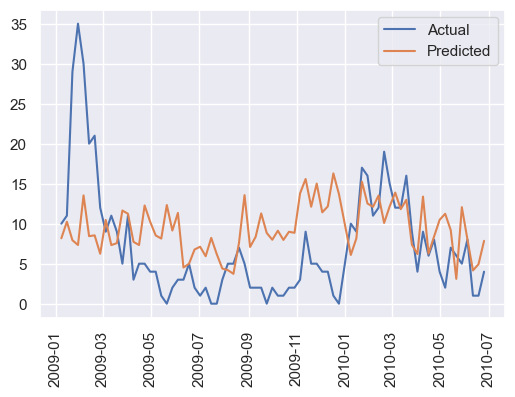

In [445]:
plot_predict(df_test_iq, y_test_iq, y_pred_iq)

## San Juan
- Helen: psxhs13

In [446]:
grid = np.linspace(1,100,20)
results = nested_cross_validation(_train_sj, grid, features2keep_sj)
best_model = results['model']


    # Final evaluation with the test set
y_pred_sj = best_model.predict(_test_sj)
mae = mean_absolute_error(_test_sj["total_cases"], y_pred_sj)

res_NB_sj = {'algorithm': ['NBR'],
       'city': ['San Juan'],
       'MAE CV': [results['mean_score']],
       'MAE SD': [results['sd_score']],
       'MAE test': [mae],
       'nMAE': [round(mae/np.mean(y_test_sj),3)]
         }
res_NB_sj


{'algorithm': ['NBR'],
 'city': ['San Juan'],
 'MAE CV': [37.33880597014925],
 'MAE SD': [9.810223753150538],
 'MAE test': [19.4421507423692],
 'nMAE': [0.896]}

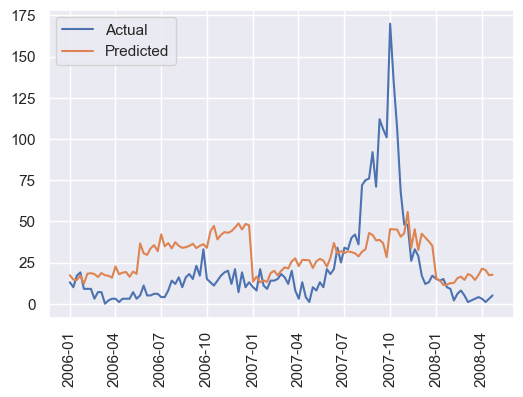

In [447]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

# Exporting results to Latex

- Dominic: psxdm9

In [448]:
# Combine all results
def merge_res(d1,d2): #Function to merge dictionary
    return {k: [*d1.get(k, []), *d2.get(k, [])] for k in set(d1) | set(d2)}

from functools import reduce
metrics = reduce(merge_res, [res_svr_iq, res_svr_sj, res_xgb_iq, res_xgb_sj, res_poisson_iq, res_poisson_sj,
                              res_rf_iq, res_rf_sj, res_GBT_iq, res_GBT_sj, res_NB_iq, res_NB_sj])

metrics1 = pd.DataFrame(metrics)[['city', 'algorithm','MAE CV', 'MAE SD', 'MAE test', 'nMAE']]

metrics1.to_latex()


import os
# Model comparison
try:
    # Create the directory if it doesn't exist
    dest_path = './tables'
    os.makedirs(dest_path, exist_ok=True)

    # Convert DataFrame to LaTeX
    metrix = metrics1.to_latex(float_format='%.3f',index=False)
    print(metrix)
    # Write the LaTeX string to the file
    with open('./tables/metrix.tex', 'w') as f:
        f.write(metrix)
except Exception as e:
    print(e)


\begin{tabular}{llrrrr}
\toprule
city & algorithm & MAE CV & MAE SD & MAE test & nMAE \\
\midrule
Iquitos & SVR & 6.852 & 1.694 & 4.610 & 0.642 \\
San Juan & SVR & 24.256 & 9.928 & 14.953 & 0.689 \\
Iquitos & XGboost & 0.620 & 9.928 & 4.769 & 0.664 \\
San Juan & XGboost & 0.201 & 0.297 & 13.868 & 0.639 \\
Iquitos & Poisson & 2.228 & 3.672 & 5.547 & 0.772 \\
San Juan & Poisson & 0.762 & 0.980 & 20.938 & 0.965 \\
Iquitos & RF & 1.169 & 0.910 & 5.286 & 0.736 \\
San Juan & RF & 2.577 & 3.680 & 20.335 & 0.937 \\
Iquitos & GBT & 6.527 & 1.678 & 4.632 & 0.645 \\
San Juan & GBT & 25.030 & 9.635 & 15.473 & 0.713 \\
Iquitos & NBR & 7.855 & 2.621 & 5.727 & 0.797 \\
San Juan & NBR & 37.339 & 9.810 & 19.442 & 0.896 \\
\bottomrule
\end{tabular}



In [449]:
metrics1.columns
metrics1[['city', 'algorithm','MAE CV', 'MAE SD', 'MAE test', 'nMAE']]

,city,algorithm,MAE CV,MAE SD,MAE test,nMAE
0,Iquitos,SVR,6.852000,1.694000,4.610000,0.642
1,San Juan,SVR,24.256000,9.928000,14.953000,0.689
2,Iquitos,XGboost,0.620035,9.928000,4.768800,0.664
3,San Juan,XGboost,0.201120,0.296885,13.868475,0.639
4,Iquitos,Poisson,2.227643,3.672037,5.546673,0.772
5,San Juan,Poisson,0.761995,0.979515,20.937782,0.965
6,Iquitos,RF,1.168852,0.910434,5.286147,0.736
7,San Juan,RF,2.577492,3.679801,20.334880,0.937
8,Iquitos,GBT,6.527408,1.677707,4.631998,0.645
9,San Juan,GBT,25.029940,9.634912,15.473475,0.713
